THOUGHTS
--------

Предположим, что задача уже решена.
Есть программа, которая получает на вход видео, обрабатывает его и на выходе дает лог обнаруженных событий и видео, иллюстрирующее эти события.

Пробуем действовать так:
* на каждом кадре видео запускается каскад, получаются кандидаты или ничего
* кандидаты фильтруются (выкидываем подписи регистратора, случайные срабатывания и т.д.), остаются только `ROI` (Region of Interest) на которых с некоторой уверенностью есть номерной знак
* К каждому `ROI` на всех последующих кадрах применяется `Camshift`, так чтобы у нас по всему видео, сразу после удачного срабатывания каскада были размечены `ROI` -- места, где нужно искать номерной знак.

Технические детали:
-----------------
------------------
Подробнее о том, что следует делать после того, как мы получили кандидатов из каскада.

<img src="two_ways.png">
 
* Для фильтрации кандидатов можно использовать некий классификатор, который после правильного обучения говорит -- нормальный у нас `ROI` или скорее нет. Или еще какую-нибудь штуку, которая будет фильтровать кандидатов.
Для этого я попыталась использовать `pHash`, но хорошо приспособить его для данной цели не получилось.


* Another way:  пользуясь идеями ребят из openALPR (see [here](https://www.google.com)), можно искать связанные области (так называемые `blobs`) в прямоугольниках. Для этого я применяла алгоритмы из `sklearn`(). При таком подходе можно там же выделять рамки.
____

# Замечания ребят из рекогнитора

В [статье](http://habrahabr.ru/company/recognitor/blog/221891/) хорошо описан подход к написанию системы для распознавания "сложных случаев" номеров. На самом деле четкого плана там нет, но есть описание методов, которые можно попробовать использовать. Весь интерес представляют собой методы выделения точных границ, т.к. в остальном подход почти очевидный.

* [преобразование Хаффа](https://ru.wikipedia.org/wiki/%D0%9F%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5_%D0%A5%D0%B0%D1%84%D0%B0)

 * Преобразование Хаффа позволяет очень быстро выделить две главных прямых и обрезать по ним изображение. Удобно, если номер повернут, что случается очень часто.

*  [Анализ только части границ](http://www.iaeng.org/publication/WCECS2012/WCECS2012_pp199-203.pdf)
 * Метод, который использовала я, сравнительно простой и работает плохо. Можно попробовать заморочиться с такой штукой.
* **Гистограмный анализ изображения**
 * сразу отпадает для детекции и фильтрации того, что распознал хаар. Подходит только для детекции и обрезки букв в уже обрезанном номере. Здесь это действительно неплохой подход.

______

## Simple haar detection

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:28: DeprecationWarning: elementwise comparison failed; this will raise the error in the future.


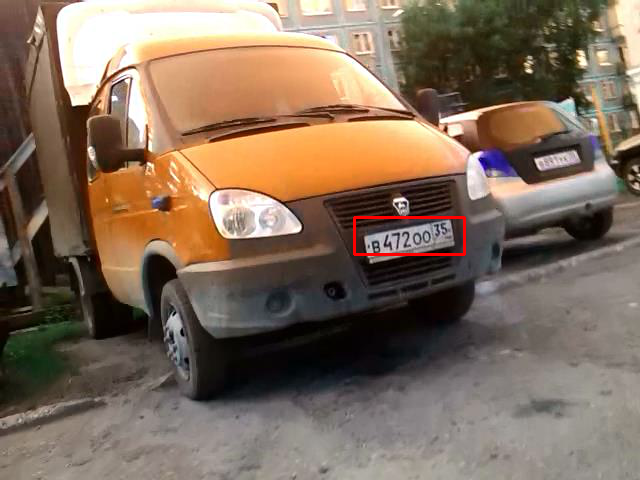

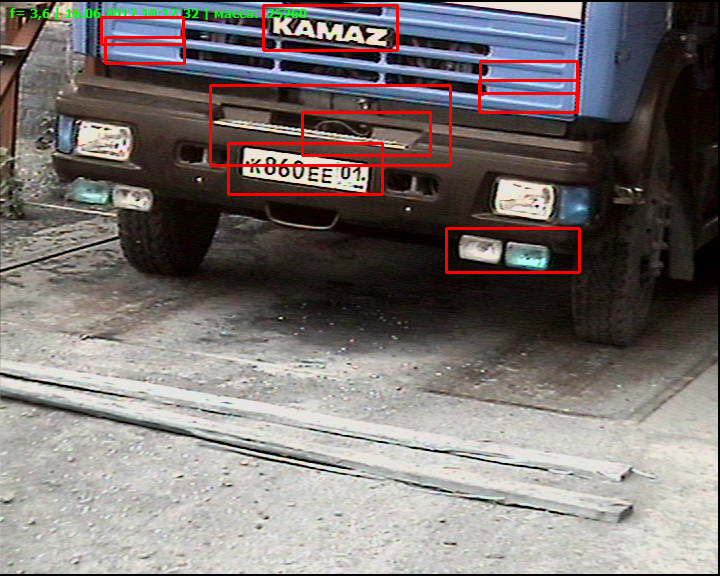

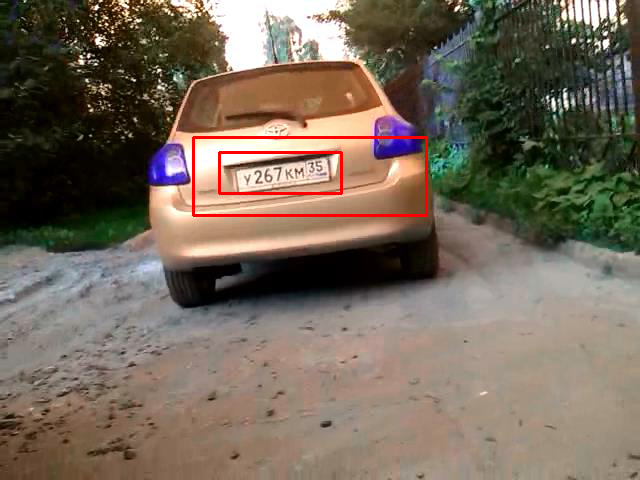

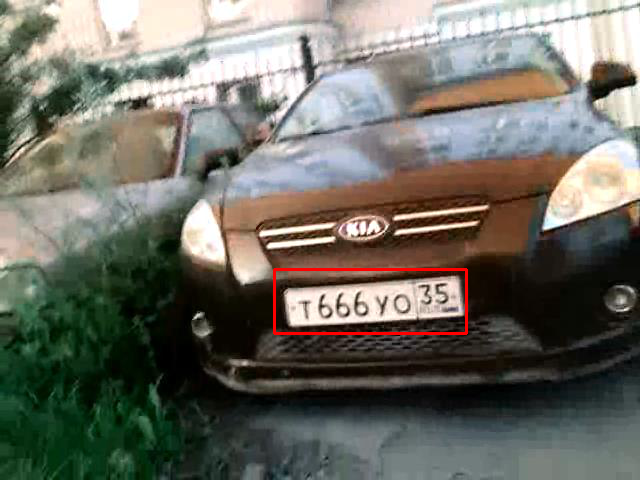

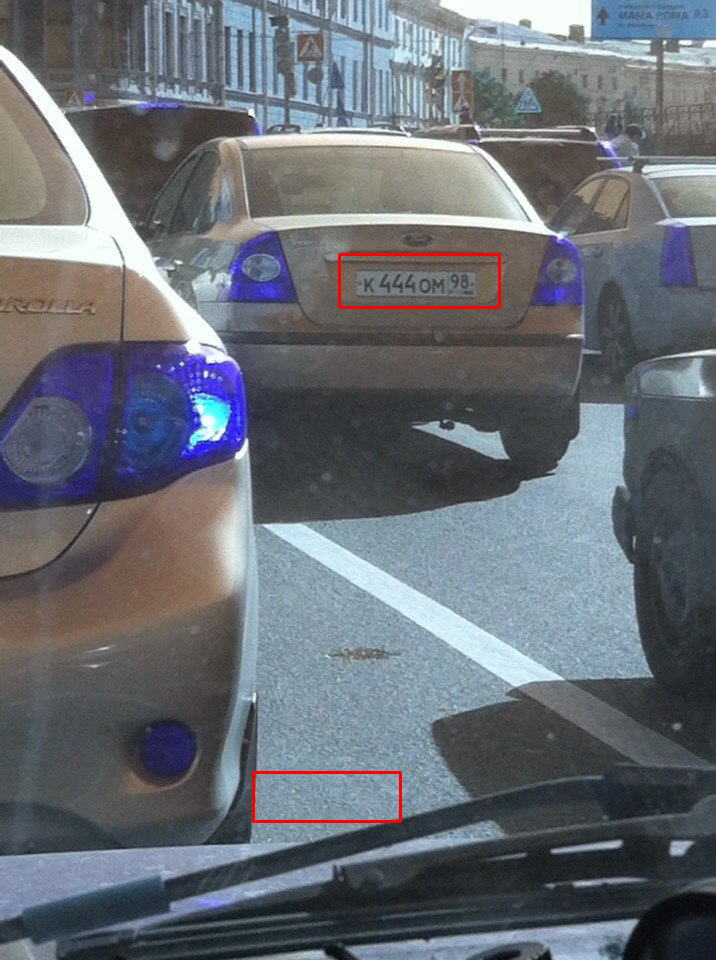

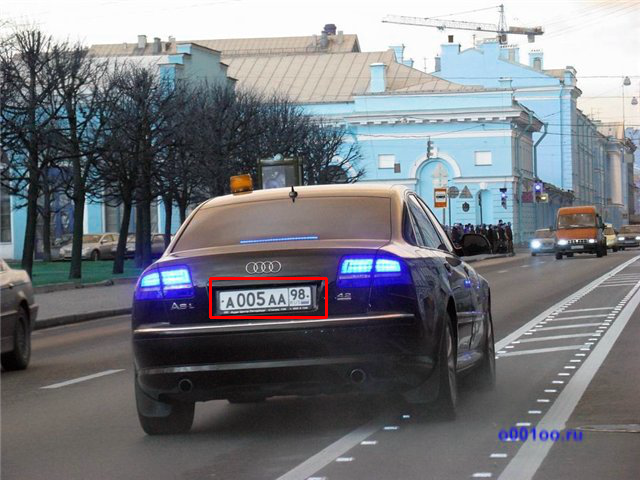

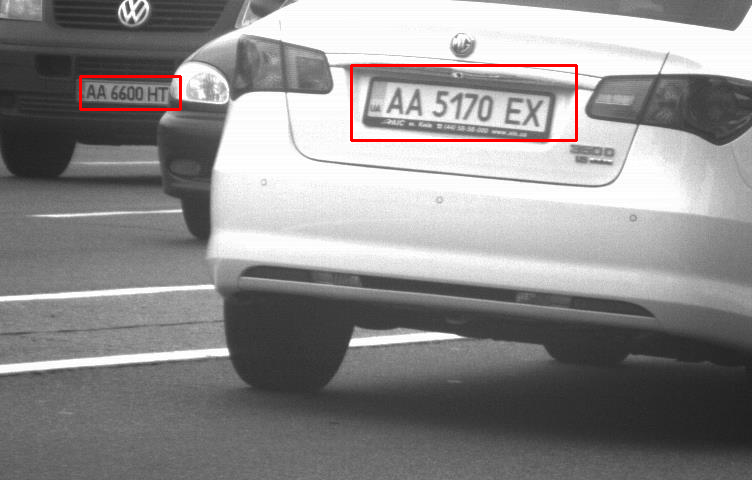

In [8]:
import numpy as np
import cv2
from glob import glob
import matplotlib.pyplot as plt
from IPython.display import Image
from IPython.display import display
import PIL
from io import BytesIO

def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png'))



number_cascade = cv2.CascadeClassifier("./examples/haarcascade_russian_plate_number.xml")
for fn in glob('./examples/*.bmp'):
    img = cv2.imread(fn) #, cv2.cv.CV_LOAD_IMAGE_COLOR
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    '''
detectMultiScale parameters: 
cv2.CascadeClassifier.detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
    '''
    plates = number_cascade.detectMultiScale(gray, 1.01, 4 ,minSize=(10, 10), flags=cv2.cv.CV_HAAR_SCALE_IMAGE)
    if plates == ():
        print("nothing found")
    else:
        for (x,y,w,h) in plates:
            cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
        display_img_array(img)
            


# Simple rectangle search
____

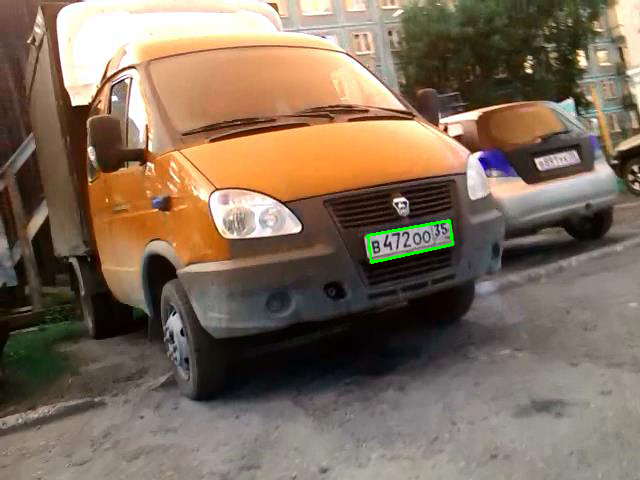

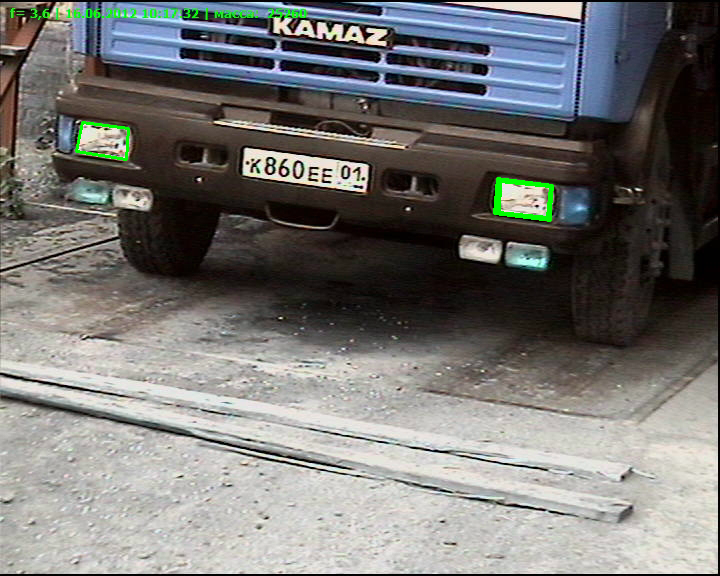

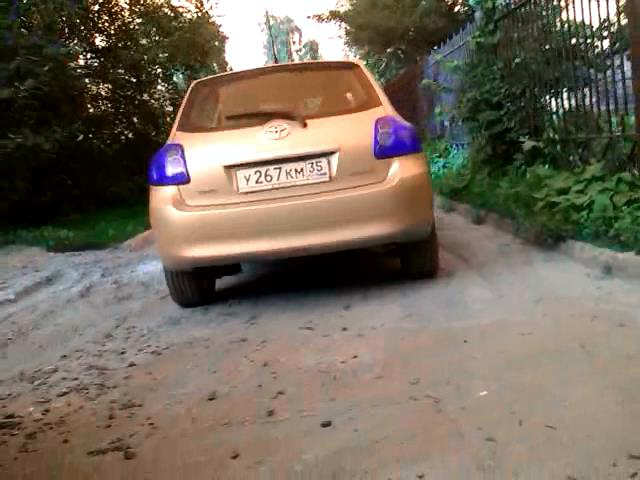

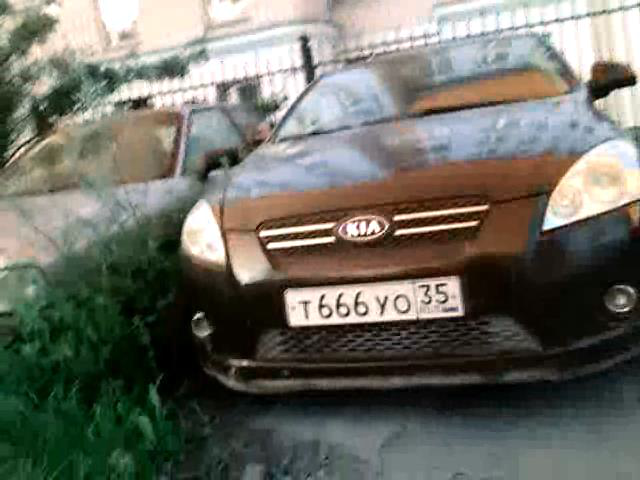

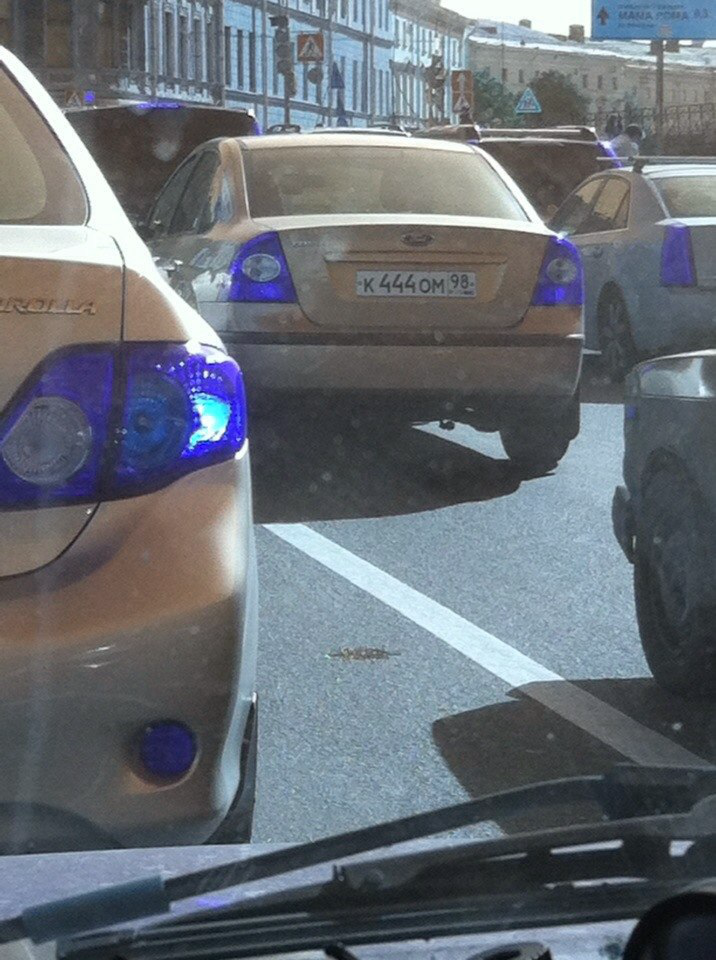

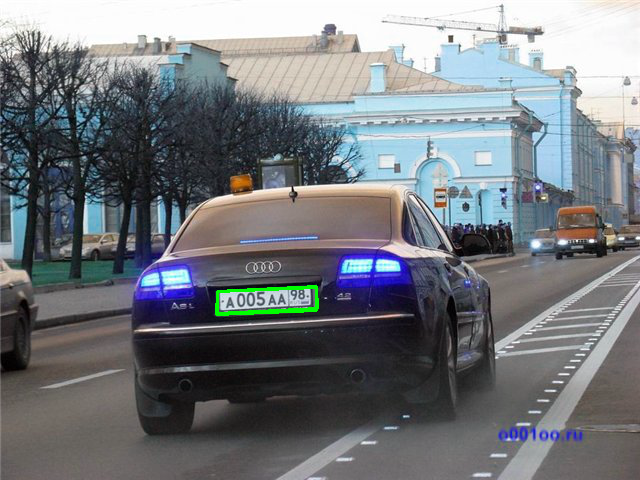

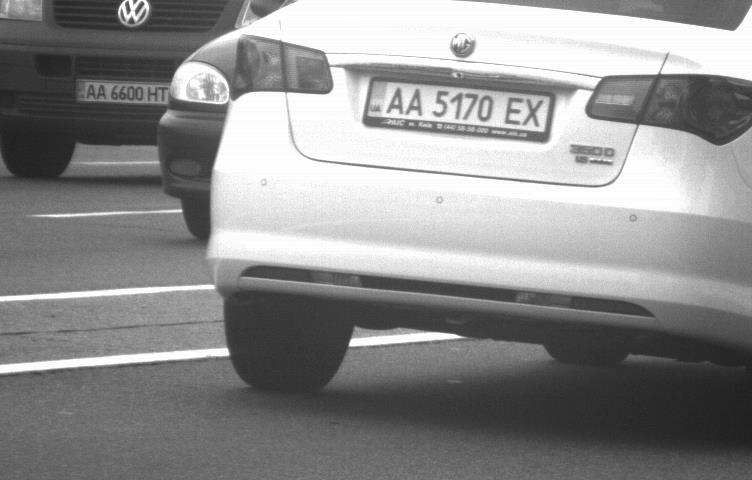

In [31]:

'''
Simple "Square Detector" program.
Loads several images sequentially and tries to find squares in each image.
'''

import numpy as np
import cv2
from glob import glob
import matplotlib.pyplot as plt
from IPython.display import Image
from IPython.display import display
import PIL
from io import BytesIO

def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png'))

def angle_cos(p0, p1, p2):
    d1, d2 = (p0-p1).astype('float'), (p2-p1).astype('float')
    return abs( np.dot(d1, d2) / np.sqrt( np.dot(d1, d1)*np.dot(d2, d2) ) )

def find_squares(img):
    img = cv2.GaussianBlur(img, (5, 5), 0)
    squares = []
    for gray in cv2.split(img):
        for thrs in xrange(0, 255, 26):
            if thrs == 0:
                bin = cv2.Canny(gray, 0, 50, apertureSize=5)
                bin = cv2.dilate(bin, None)
            else:
                retval, bin = cv2.threshold(gray, thrs, 255, cv2.THRESH_BINARY)
#                 display_img_array(bin)

            contours, hierarchy = cv2.findContours(bin, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
            for cnt in contours:
                cnt_len = cv2.arcLength(cnt, True)
                cnt = cv2.approxPolyDP(cnt, 0.02*cnt_len, True)
                if len(cnt) == 4 and cv2.contourArea(cnt) > 800 and cv2.contourArea(cnt) < 3000 and cv2.isContourConvex(cnt):
                    cnt = cnt.reshape(-1, 2)
                    max_cos = np.max([angle_cos( cnt[i], cnt[(i+1) % 4], cnt[(i+2) % 4] ) for i in xrange(4)])
                    if max_cos < 0.1:
                        squares.append(cnt)
    return squares

if __name__ == '__main__':
    for fn in glob('./examples/*.bmp'):
        img = cv2.imread(fn)
        squares = find_squares(img)
        cv2.drawContours( img, squares, -1, (0, 255, 0), 2 )
        display_img_array(img)

# Haar + rectangle_detection
___

> red --- haar cascade detected


> green --- rectangle_detection in the haar cascade detected area

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:64: DeprecationWarning: elementwise comparison failed; this will raise the error in the future.


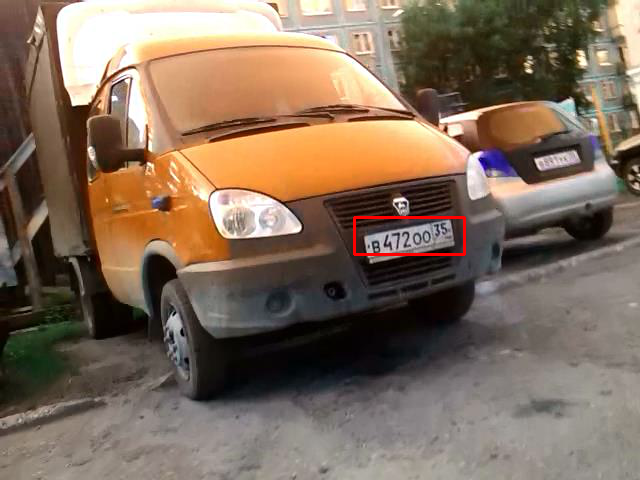

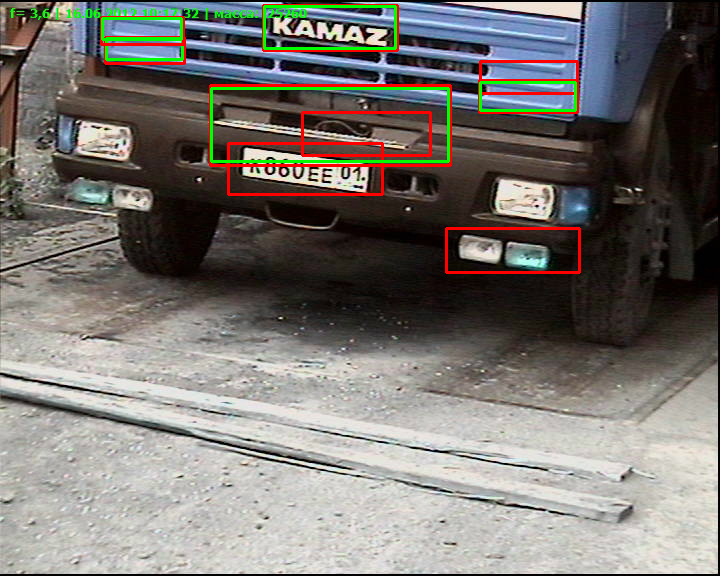

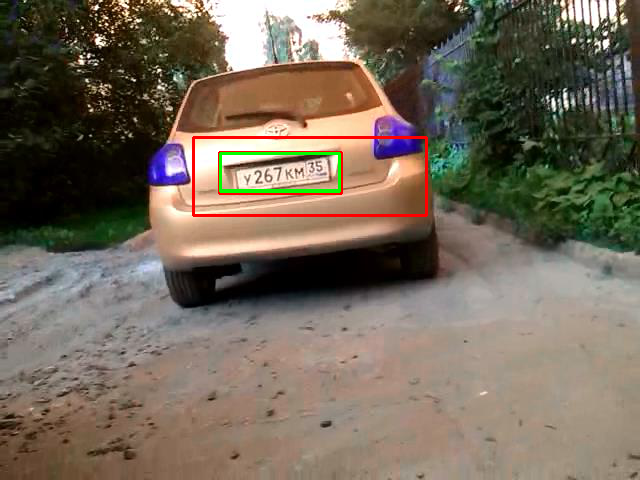

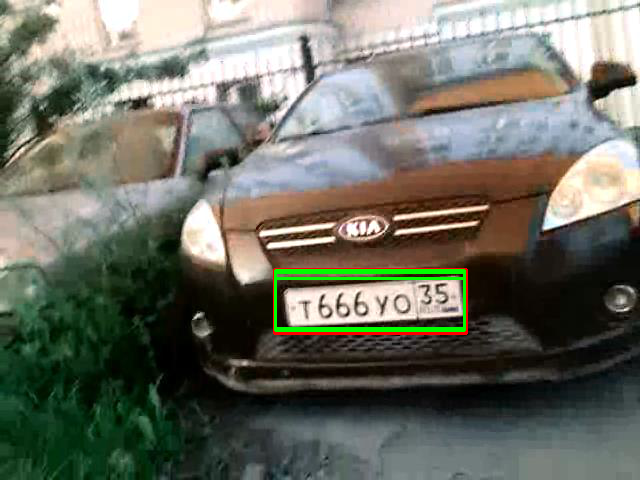

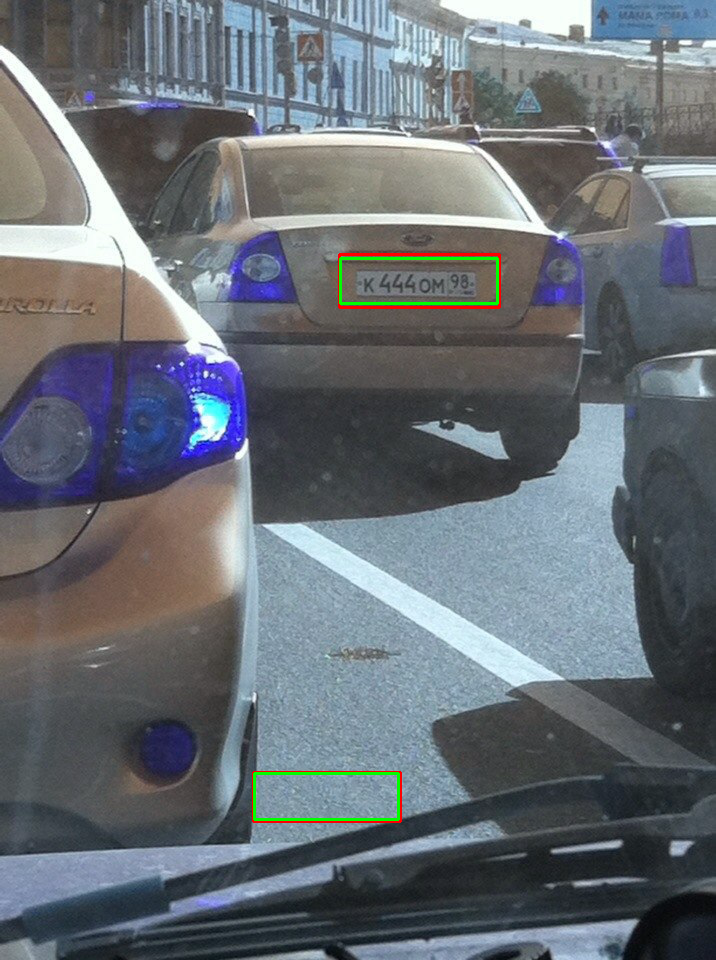

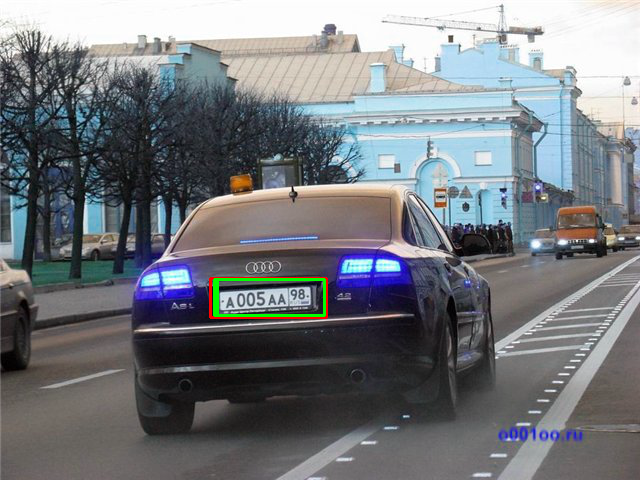

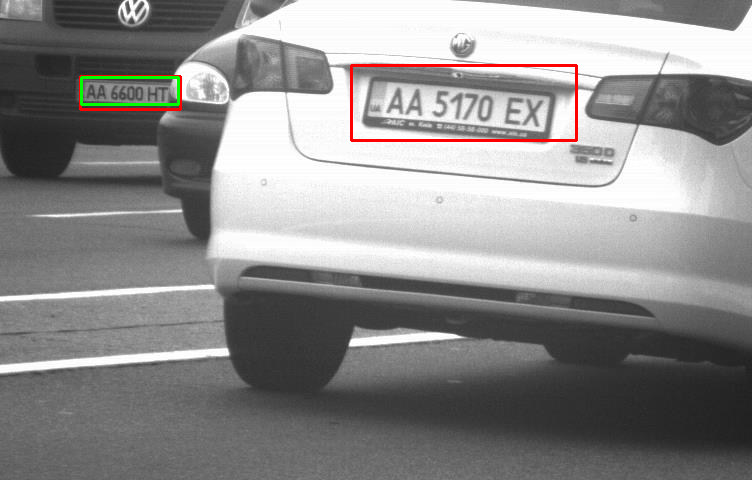

In [1]:
__author__ = 'fogside'

import sys
import numpy as np
import cv2
from copy import copy
import matplotlib.pyplot as plt
from IPython.display import Image
from IPython.display import display
import PIL
from glob import glob
from io import BytesIO


def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png'))

def angle_cos(p0, p1, p2):
    d1, d2 = (p0 - p1).astype('float'), (p2 - p1).astype('float')
    return abs(np.dot(d1, d2) / np.sqrt(np.dot(d1, d1) * np.dot(d2, d2)))


def find_squares(img):
    img = cv2.GaussianBlur(img, (5, 5), 0)
    
    kernel = np.ones((5,5),np.uint8)    
    img = cv2.dilate(img,kernel,iterations = 1)
    img = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
    
    squares = []
    for gray in cv2.split(img):
        for thrs in xrange(0, 255, 26):
#             if thrs == 0:
            bin = cv2.Canny(gray, 0, 50, apertureSize=5)
            bin = cv2.dilate(bin, None)
#             else:
#                 retval, bin = cv2.threshold(gray, thrs, 255, cv2.THRESH_BINARY)
            contours, hierarchy = cv2.findContours(bin, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
            for cnt in contours:
                cnt_len = cv2.arcLength(cnt, True)
                cnt = cv2.approxPolyDP(cnt, 0.02 * cnt_len, True)
                if len(cnt) == 4 and cv2.contourArea(cnt) > 600 and cv2.isContourConvex(cnt):
                    cnt = cnt.reshape(-1, 2)
                    max_cos = np.max([angle_cos(cnt[i], cnt[(i + 1) % 4], cnt[(i + 2) % 4]) for i in xrange(4)])
                    if max_cos < 0.5:
                        squares.append(cnt)
    return squares


if __name__ == '__main__':
    number_cascade = cv2.CascadeClassifier("./examples/haarcascade_russian_plate_number.xml")
for fn in glob('./examples/*.bmp'):
    img = cv2.imread(fn) #, cv2.cv.CV_LOAD_IMAGE_COLOR
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    '''
detectMultiScale parameters: 
cv2.CascadeClassifier.detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
    '''
    plates = number_cascade.detectMultiScale(gray, 1.01, 4 ,minSize=(10, 10), flags=cv2.cv.CV_HAAR_SCALE_IMAGE)
    if plates == ():
        print("nothing found")
    else:
        img_copy = copy(img)
        for (x,y,w,h) in plates:
            cv2.rectangle(img_copy,(x,y),(x+w,y+h),(255,0,0),2)
            roi_color = img[y:y + h, x:x + w]
            squares = find_squares(roi_color)
            for sq in squares:
                cv2.rectangle(img_copy, (x+sq[0][0],y+sq[0][1]),(x+sq[2][0],y+sq[2][1]),(0,255,0), 2)
        display_img_array(img_copy)
        


# Blobs detection algorithms
___

During my investigation I found out that `Laplacian of Gaussian (LoG)` algo is the most effective in this problem if we invert the image. 

*Blobs_log & blobs_dog works great only for detecting light areas on the dark background, that's why I used invert image for those methods

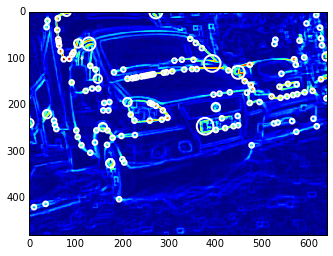

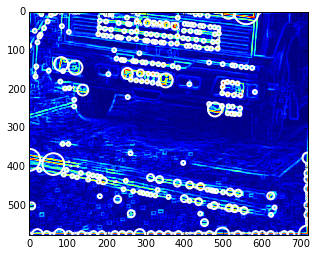

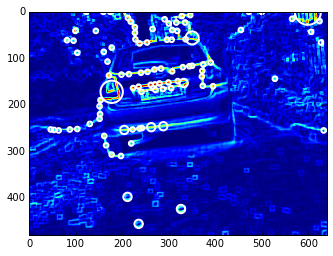

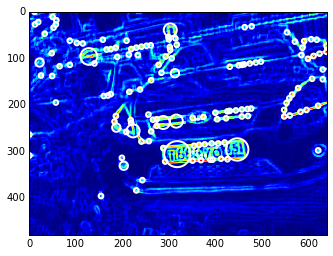

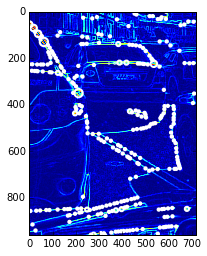

In [ ]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
from skimage.feature import blob_dog, blob_log, blob_doh
from math import sqrt
from skimage.color import rgb2gray
import cv2
import PIL
from glob import glob
from io import BytesIO
from IPython.display import Image
from IPython.display import display
    
kernel = np.ones((5,5),np.uint8)    
for fn in glob("./examples/*.bmp"):
    img = cv2.imread(fn)
    inverse_img = (255-img) 
    gray = rgb2gray(inverse_img)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    gray = cv2.dilate(gray,kernel,iterations = 1)
    gray = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel)
    cv2.imshow("lol",gray)
    cv2.waitKey()


    blobs_log = blob_log(gray, max_sigma=30, num_sigma=10, threshold=.1)
    # Compute radii in the 3rd column.
    blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

#     blobs_dog = blob_dog(gray, max_sigma=30, threshold=.1)
#     blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)
    
#     blobs_doh = blob_doh(rgb2gray(img), max_sigma=30, threshold=.01)


    fig, ax = plt.subplots(1, 1)
    ax.imshow(gray, interpolation='nearest')
    for log in blobs_log:
        y, x, r = log
        #draw blobs_log
        c = plt.Circle((x, y), r, color="white", linewidth=2, fill=False)
        ax.add_patch(c)
        
#         #draw blods_dog
#         y, x, r = dog
#         c = plt.Circle((x, y), r, color="red", linewidth=2, fill=False)
#         ax.add_patch(c)
        
#         #draw blobs_doh
#         y, x, r = doh
#         c = plt.Circle((x, y), r, color="yellow", linewidth=2, fill=False)
#         ax.add_patch(c)        

    plt.show()

So, you can see that large amount of white circles concentrated at plate number. So, that means we should try use `Laplacian of Gaussian (LoG)` algo for numbers detection.

# Haar + blobs
___

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:49: DeprecationWarning: elementwise comparison failed; this will raise the error in the future.


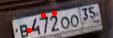

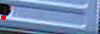

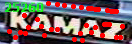

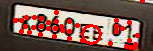

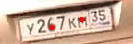

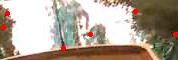

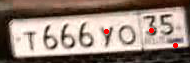

IndexError: too many indices for array

In [14]:
%matplotlib inline
import numpy as np
import cv2
from glob import glob
import matplotlib.pyplot as plt
from IPython.display import Image
from IPython.display import display
import PIL
from io import BytesIO
from skimage.feature import blob_dog, blob_log, blob_doh
from math import sqrt
from skimage.color import rgb2gray
    

def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png'))

def is_there_blobs(roi):
    inverse_roi = (255-roi)
#     inverse_roi = cv2.equalizeHist(inverse_roi)
    kernel = np.ones((5,5),np.uint8)
    gray = rgb2gray(inverse_roi)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    gray = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    blobs_log = blob_log(gray, max_sigma=30, num_sigma=10, threshold=.1)
    
    # Compute radii in the 3rd column.
    blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)
    for blob in blobs_log:
        y, x, r = blob
        cv2.circle(roi, (x,y), r, 255, 2)
    display_img_array(roi)


number_cascade = cv2.CascadeClassifier("./examples/haarcascade_russian_plate_number.xml")
for fn in glob('./examples/*.bmp'):
    img = cv2.imread(fn) #, cv2.cv.CV_LOAD_IMAGE_COLOR
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)
    
    '''
detectMultiScale parameters: 
cv2.CascadeClassifier.detectMultiScale(image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]]]]])
    '''
    plates = number_cascade.detectMultiScale(gray, 1.01, 4 ,minSize=(10, 10), flags=cv2.cv.CV_HAAR_SCALE_IMAGE)
    if plates == ():
        print("nothing found")
    else:
        for (x,y,w,h) in plates:
            roi = img[y:y+h, x:x+w]
            is_there_blobs(roi)
#             cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)



#     display_img_array(img)

Похоже тут получается довольно бессмысленная штука...